<a href="https://colab.research.google.com/github/EngineerMac/MEng-Diss/blob/main/visualisation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [89]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

new_data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/solution_15.csv', delim_whitespace=True)

new_data.head()

<ipython-input-89-90a35e0a0a44>:5: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  new_data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/solution_15.csv', delim_whitespace=True)


,nodenumber,x-coordinate,y-coordinate,z-coordinate,z-velocity,y-velocity,x-velocity
0,1,7.486001,2.753000,2.180577,0.000000,0.000000,0.000000
1,2,7.477638,2.744637,2.180577,0.012971,0.000115,0.000178
2,3,7.477635,2.744634,2.231692,0.013082,0.000038,0.000093
3,4,7.486001,2.753000,2.231692,0.000000,0.000000,0.000000
4,5,7.471570,2.753000,2.180694,0.000000,0.000000,0.000000


In [90]:
new_column_names = ['N', 'x', 'y', 'z', 'vz', 'vy', 'vx']  # Replace with actual names
new_data.columns = new_column_names

In [91]:
print(new_data.columns)

Index(['N', 'x', 'y', 'z', 'vz', 'vy', 'vx'], dtype='object')


In [92]:
new_data.head()

,N,x,y,z,vz,vy,vx
0,1,7.486001,2.753000,2.180577,0.000000,0.000000,0.000000
1,2,7.477638,2.744637,2.180577,0.012971,0.000115,0.000178
2,3,7.477635,2.744634,2.231692,0.013082,0.000038,0.000093
3,4,7.486001,2.753000,2.231692,0.000000,0.000000,0.000000
4,5,7.471570,2.753000,2.180694,0.000000,0.000000,0.000000


In [93]:
new_column_names = ['N', 'x', 'y', 'z', 'vz', 'vy', 'vx']  # Replace with actual names
new_data.columns = new_column_names

In [94]:
new_column_order = ['N', 'x', 'y', 'z', 'vx', 'vy', 'vz']

# Reorder the DataFrame columns
new_data = new_data[new_column_order]

In [95]:
new_data.head()

,N,x,y,z,vx,vy,vz
0,1,7.486001,2.753000,2.180577,0.000000,0.000000,0.000000
1,2,7.477638,2.744637,2.180577,0.000178,0.000115,0.012971
2,3,7.477635,2.744634,2.231692,0.000093,0.000038,0.013082
3,4,7.486001,2.753000,2.231692,0.000000,0.000000,0.000000
4,5,7.471570,2.753000,2.180694,0.000000,0.000000,0.000000


In [96]:
df = new_data

In [97]:
df['z'].max()

7.412000179

# side view of the vertical velocity



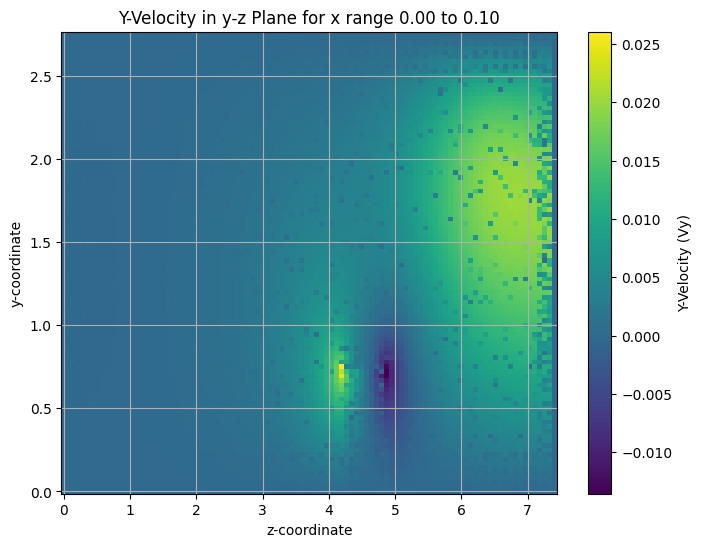

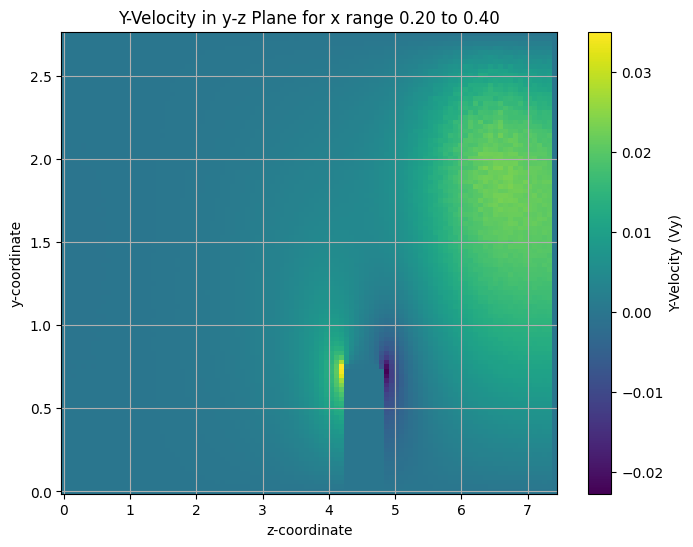

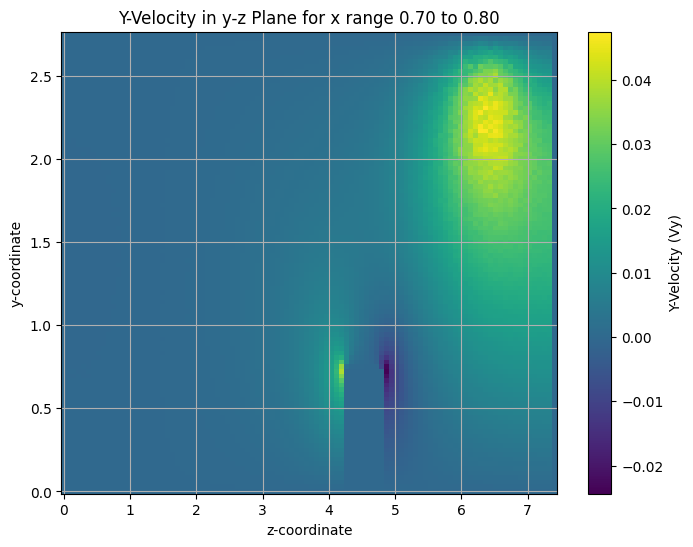

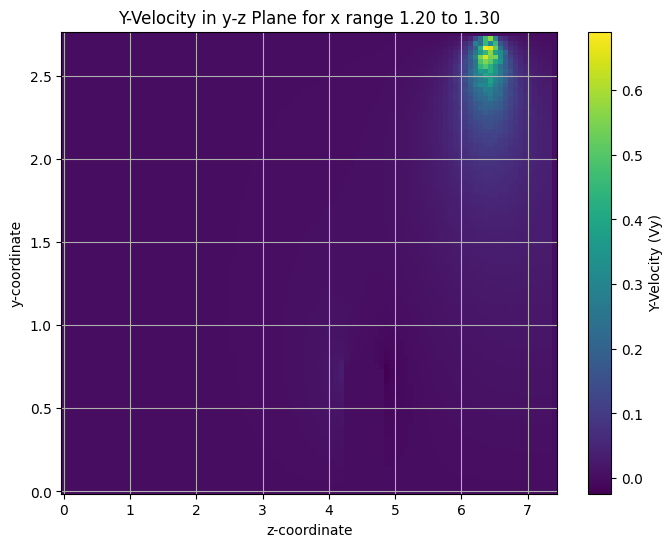

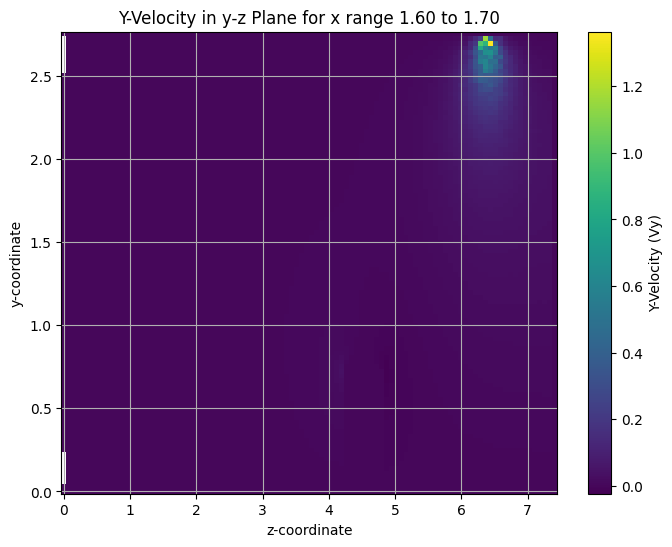

...

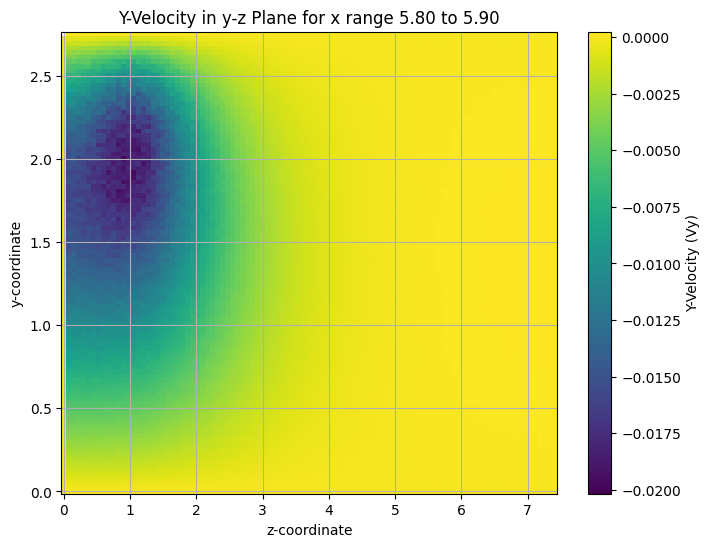

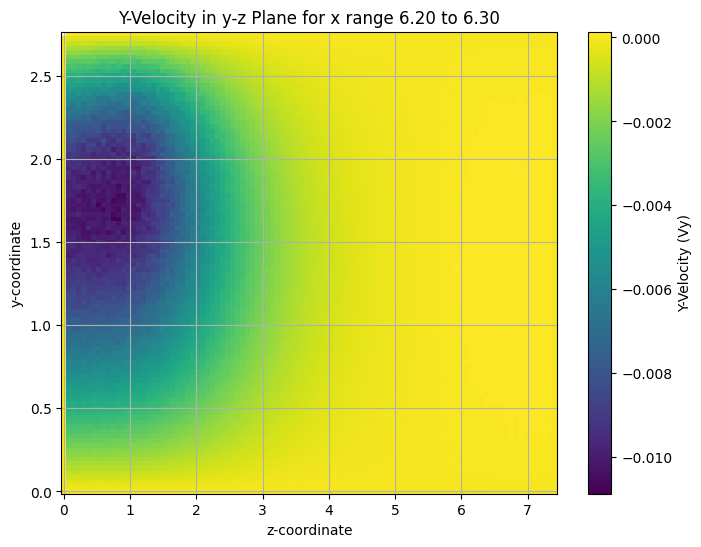

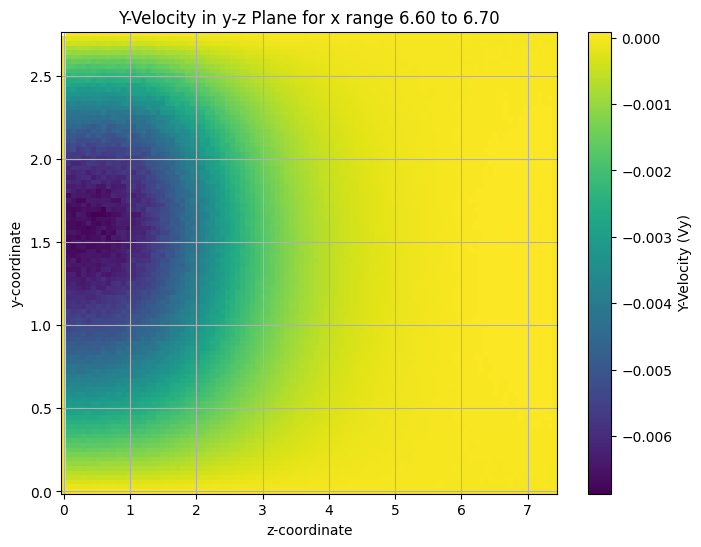

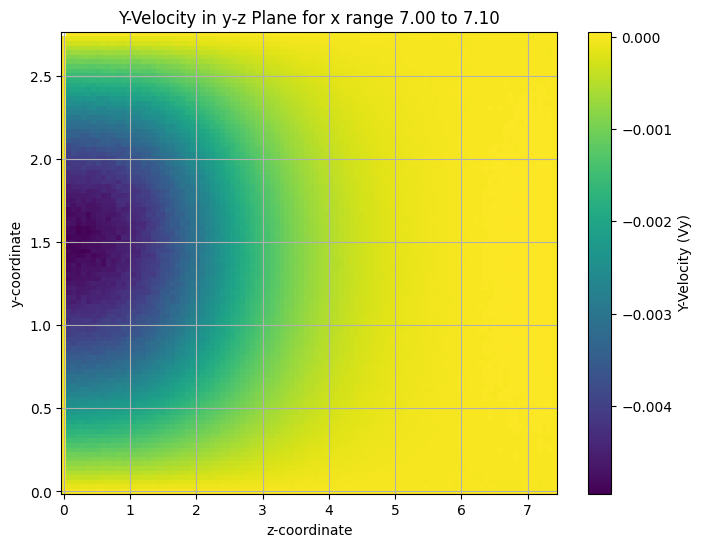

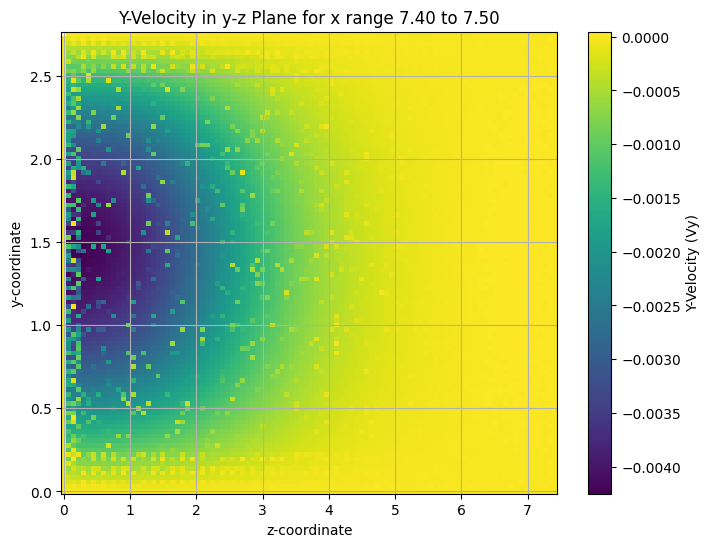

In [99]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import LinearNDInterpolator

# Define x-ranges
x_ranges = [
    (0, 0.1),
    (0.2, 0.4),
    (0.7, 0.8),
    (1.2, 1.3),
    (1.6, 1.7),
    (2.1, 2.2),
    (2.5, 2.6),
    (2.9, 3.1),
    (3.4, 3.5),
    (3.8, 3.9),
    (4.2, 4.3),
    (4.6, 4.7),
    (5.0, 5.1),
    (5.4, 5.5),
    (5.8, 5.9),
    (6.2, 6.3),
    (6.6, 6.7),
    (7.0, 7.1),
    (7.4, 7.5),
]

# Loop through the x-ranges and generate a plot for each
for i, (x_min, x_max) in enumerate(x_ranges):
    # Filter the DataFrame for the current x-range
    df_filtered = df[(df['x'] >= x_min) & (df['x'] <= x_max)]

    if df_filtered.empty:
        print(f"No data for x range {x_min} to {x_max}")
        continue

    # Extract y, z, and vy for the current x range
    y, z, vy = df_filtered['y'], df_filtered['z'], df_filtered['vy']

    # Create a grid for interpolation
    Z, Y = np.meshgrid(
        np.linspace(z.min(), z.max(), 100),
        np.linspace(y.min(), y.max(), 100),
    )

    # Use LinearNDInterpolator to interpolate vy
    interpolator_vy = LinearNDInterpolator(list(zip(y, z)), vy)
    Vy = interpolator_vy(Y, Z)

    # Mask NaN values in Vy
    Vy = np.ma.masked_invalid(Vy)

    # Plot y vs. z with y-velocity as the color
    plt.figure(figsize=(8, 6))
    plt.pcolormesh(Z, Y, Vy, cmap='viridis', shading='auto')
    plt.colorbar(label='Y-Velocity (Vy)')
    plt.title(f'Y-Velocity in y-z Plane for x range {x_min:.2f} to {x_max:.2f}')
    plt.xlabel('z-coordinate')
    plt.ylabel('y-coordinate')
    plt.grid()
    plt.show()


# Birds eye view of velocity


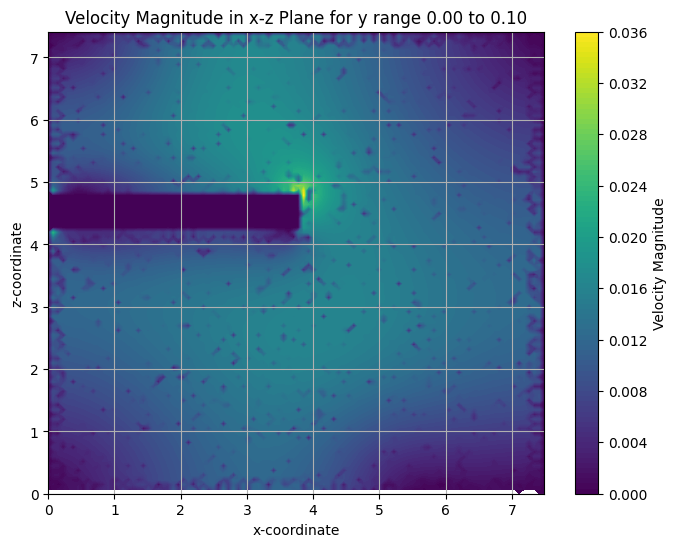

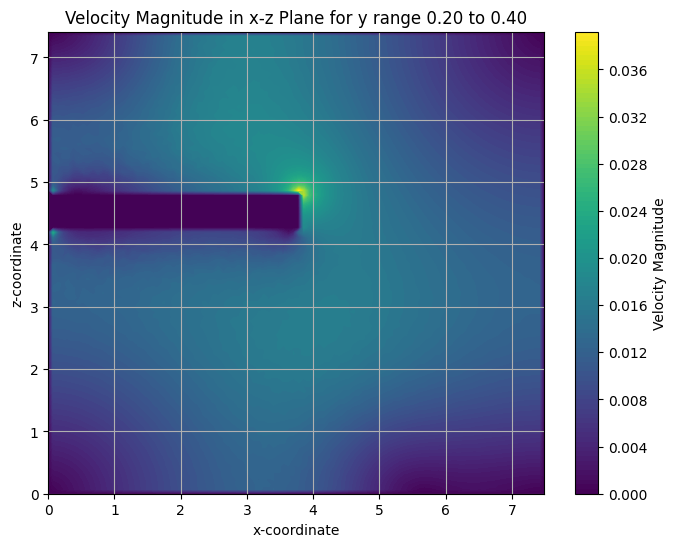

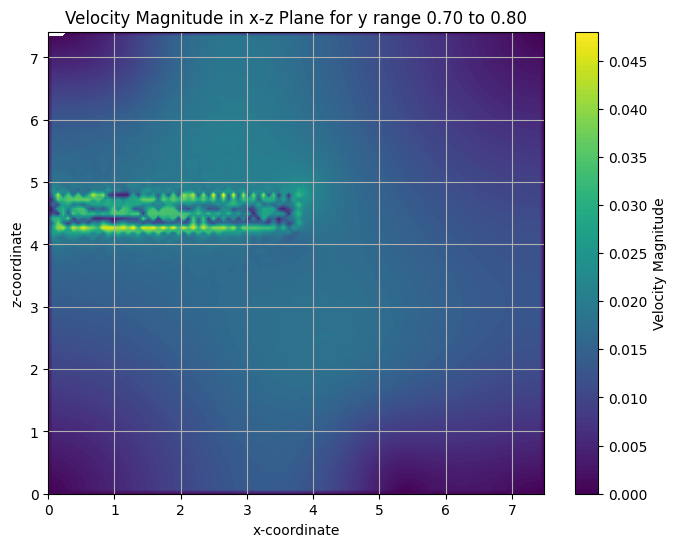

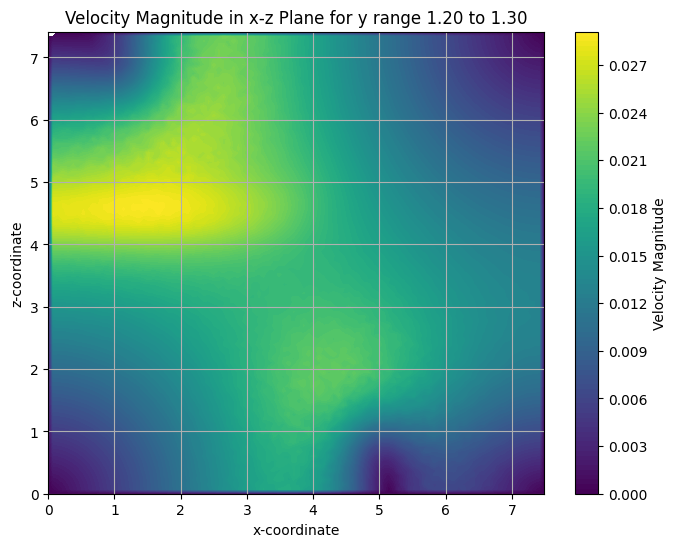

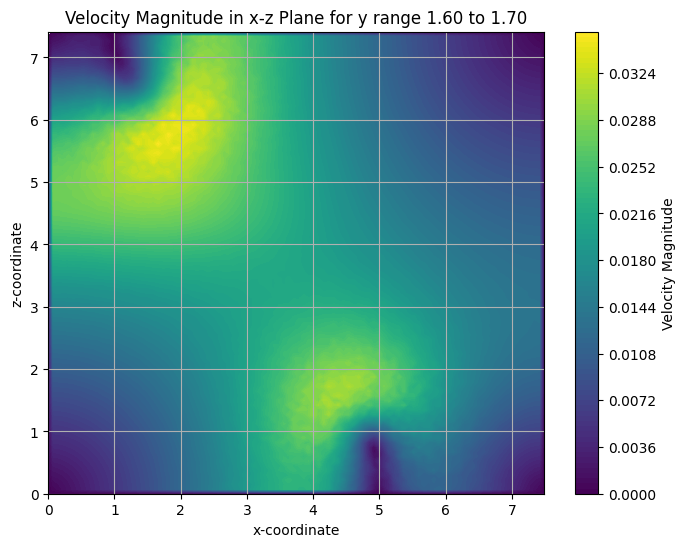

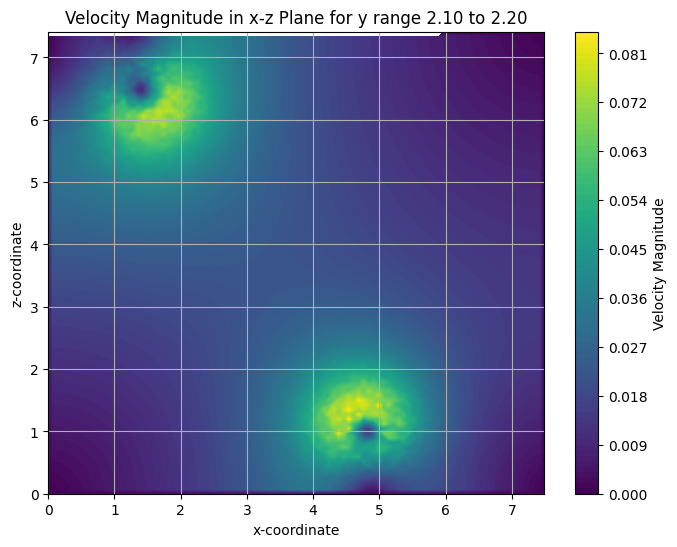

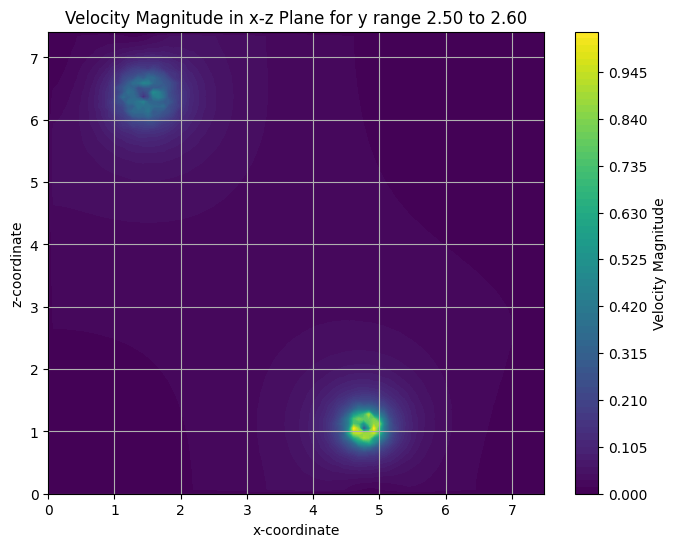

No data for y range 2.9 to 3.1
No data for y range 3.4 to 3.5
No data for y range 3.8 to 3.9
No data for y range 4.2 to 4.3
No data for y range 4.6 to 4.7
No data for y range 5.0 to 5.1
No data for y range 5.4 to 5.5
No data for y range 5.8 to 5.9
No data for y range 6.2 to 6.3
No data for y range 6.6 to 6.7
No data for y range 7.0 to 7.1
No data for y range 7.4 to 7.5


In [79]:
from scipy.interpolate import LinearNDInterpolator
import matplotlib.pyplot as plt
import numpy as np

# Define y-ranges
y_ranges = [
    (0, 0.1),
    (0.2, 0.4),
    (0.7, 0.8),
    (1.2, 1.3),
    (1.6, 1.7),
    (2.1, 2.2),
    (2.5, 2.6),
    (2.9, 3.1),
    (3.4, 3.5),
    (3.8, 3.9),
    (4.2, 4.3),
    (4.6, 4.7),
    (5.0, 5.1),
    (5.4, 5.5),
    (5.8, 5.9),
    (6.2, 6.3),
    (6.6, 6.7),
    (7.0, 7.1),
    (7.4, 7.5)
]

# Loop through the y ranges and generate a velocity magnitude plot for each
for i, (y_min, y_max) in enumerate(y_ranges):
    # Filter the DataFrame for the current y range
    df_filtered = df[(df['y'] >= y_min) & (df['y'] <= y_max)]

    if df_filtered.empty:
        print(f"No data for y range {y_min} to {y_max}")
        continue

    # Extract x, z, vx, vz values for the current y range
    x, z, vx, vz = df_filtered['x'], df_filtered['z'], df_filtered['vx'], df_filtered['vz']

    # Create a grid of points for interpolation
    X, Z = np.meshgrid(
        np.linspace(x.min(), x.max(), 100),
        np.linspace(z.min(), z.max(), 100),
    )

    # Use LinearNDInterpolator for faster interpolation
    interpolator_vx = LinearNDInterpolator(list(zip(x, z)), vx)
    interpolator_vz = LinearNDInterpolator(list(zip(x, z)), vz)

    # Evaluate the interpolators on the grid
    Vx = interpolator_vx(X, Z)
    Vz = interpolator_vz(X, Z)

    # Compute velocity magnitude
    velocity_magnitude = np.sqrt(Vx**2 + Vz**2)

    # Create the filled contour plot
    plt.figure(figsize=(8, 6))
    plt.contourf(X, Z, velocity_magnitude, levels=100, cmap='viridis')
    plt.colorbar(label='Velocity Magnitude')
    plt.title(f'Velocity Magnitude in x-z Plane for y range {y_min:.2f} to {y_max:.2f}')
    plt.xlabel('x-coordinate')
    plt.ylabel('z-coordinate')
    plt.grid()
    plt.show()


# Birds Eye View

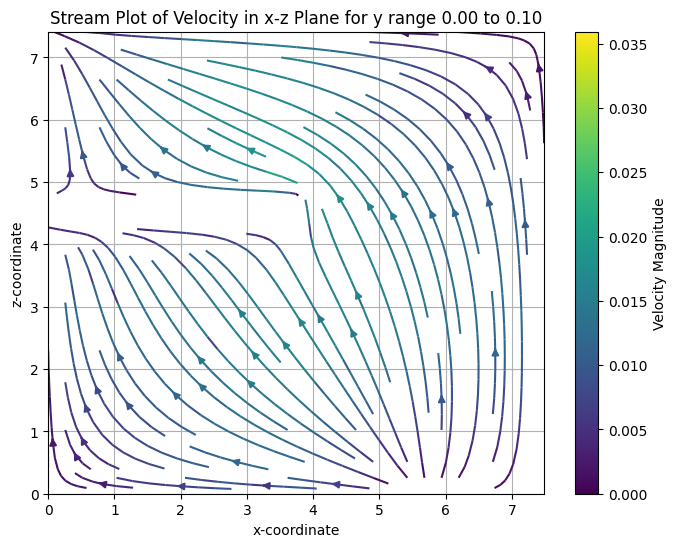

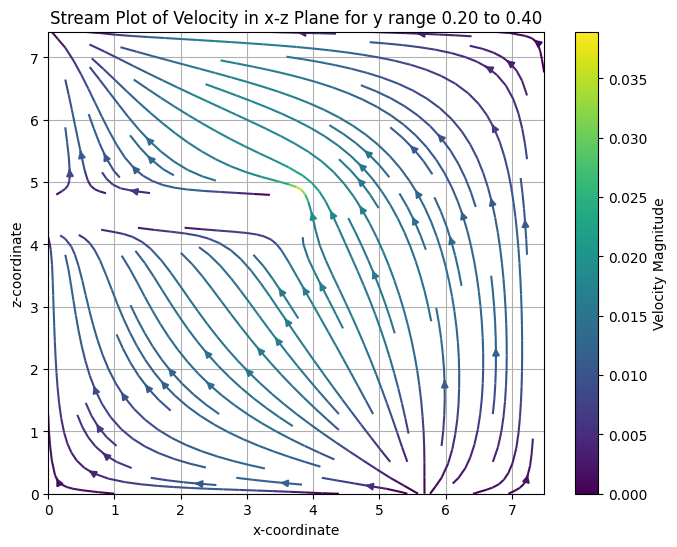

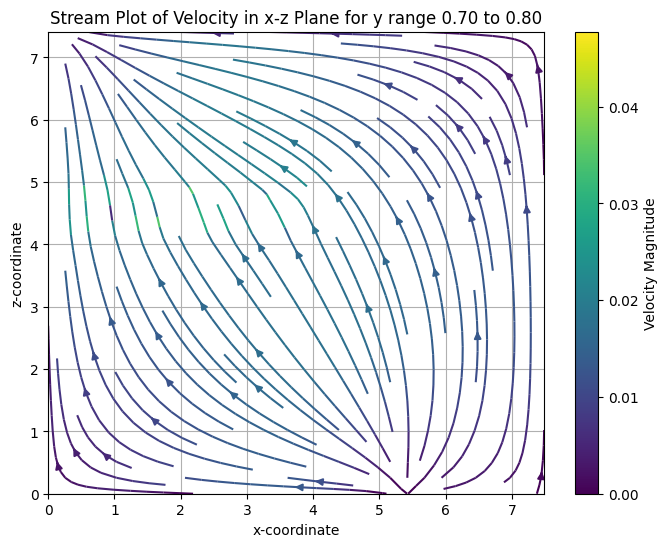

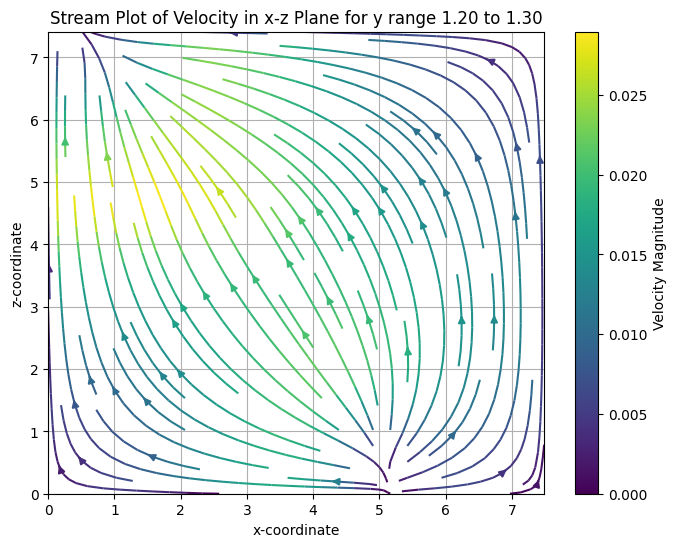

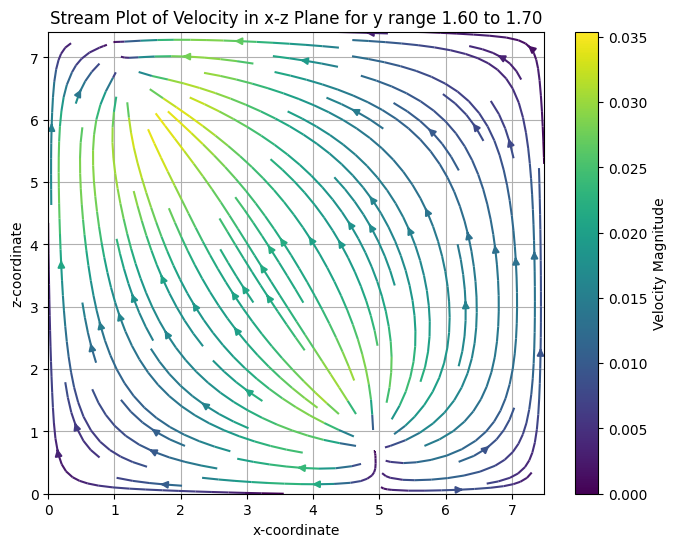

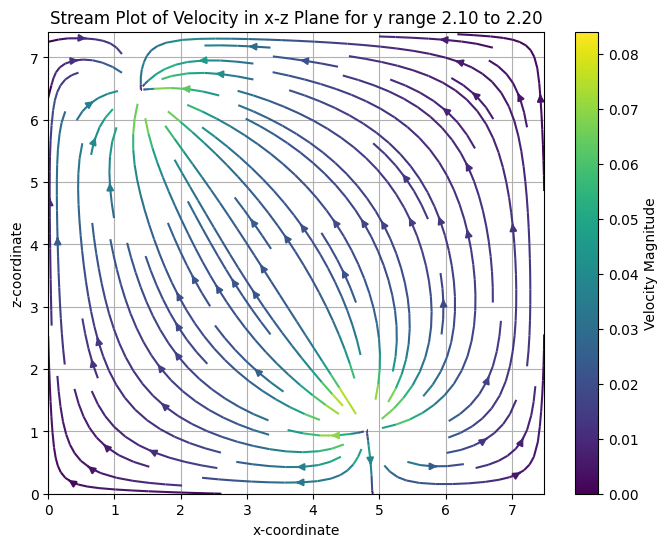

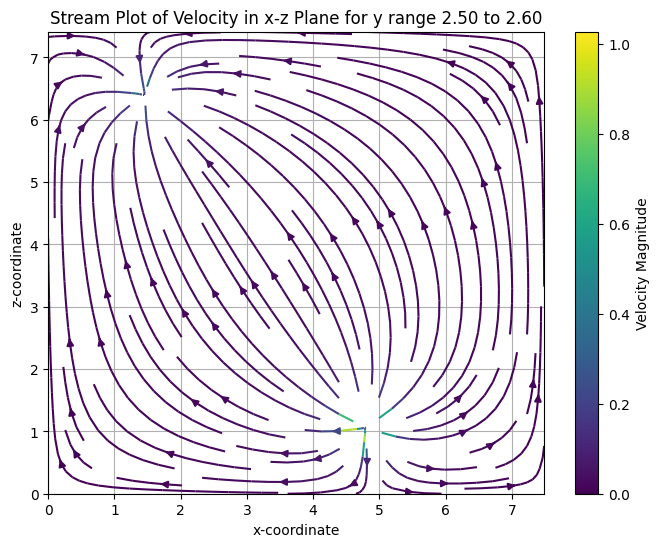

No data for y range 2.9 to 3.1
No data for y range 3.4 to 3.5
No data for y range 3.8 to 3.9
No data for y range 4.2 to 4.3
No data for y range 4.6 to 4.7
No data for y range 5.0 to 5.1
No data for y range 5.4 to 5.5
No data for y range 5.8 to 5.9
No data for y range 6.2 to 6.3
No data for y range 6.6 to 6.7
No data for y range 7.0 to 7.1
No data for y range 7.4 to 7.5


In [80]:
from scipy.interpolate import LinearNDInterpolator
import matplotlib.pyplot as plt
import numpy as np

# Define y-ranges
y_ranges = [
    (0, 0.1),
    (0.2, 0.4),
    (0.7, 0.8),
    (1.2, 1.3),
    (1.6, 1.7),
    (2.1, 2.2),
    (2.5, 2.6),
    (2.9, 3.1),
    (3.4, 3.5),
    (3.8, 3.9),
    (4.2, 4.3),
    (4.6, 4.7),
    (5.0, 5.1),
    (5.4, 5.5),
    (5.8, 5.9),
    (6.2, 6.3),
    (6.6, 6.7),
    (7.0, 7.1),
    (7.4, 7.5)
]

# Loop through the y ranges and generate a plot for each
for i, (y_min, y_max) in enumerate(y_ranges):
    # Filter the DataFrame for the current y range
    df_filtered = df[(df['y'] >= y_min) & (df['y'] <= y_max)]

    if df_filtered.empty:
        print(f"No data for y range {y_min} to {y_max}")
        continue

    # Extract x, z, vx, vz values for the current y range
    x, z, vx, vz = df_filtered['x'], df_filtered['z'], df_filtered['vx'], df_filtered['vz']

    # Create a grid of points for interpolation
    X, Z = np.meshgrid(
        np.linspace(x.min(), x.max(), 100),
        np.linspace(z.min(), z.max(), 100),
    )

    # Use LinearNDInterpolator for faster interpolation
    interpolator_vx = LinearNDInterpolator(list(zip(x, z)), vx)
    interpolator_vz = LinearNDInterpolator(list(zip(x, z)), vz)

    # Evaluate the interpolators on the grid
    Vx = interpolator_vx(X, Z)
    Vz = interpolator_vz(X, Z)

    # Create the stream plot
    plt.figure(figsize=(8, 6))
    plt.streamplot(X, Z, Vx, Vz, color=np.sqrt(Vx**2 + Vz**2), cmap='viridis')
    plt.colorbar(label='Velocity Magnitude')
    plt.title(f'Stream Plot of Velocity in x-z Plane for y range {y_min:.2f} to {y_max:.2f}')
    plt.xlabel('x-coordinate')
    plt.ylabel('z-coordinate')
    plt.grid()
    plt.show()


# View from right side of room

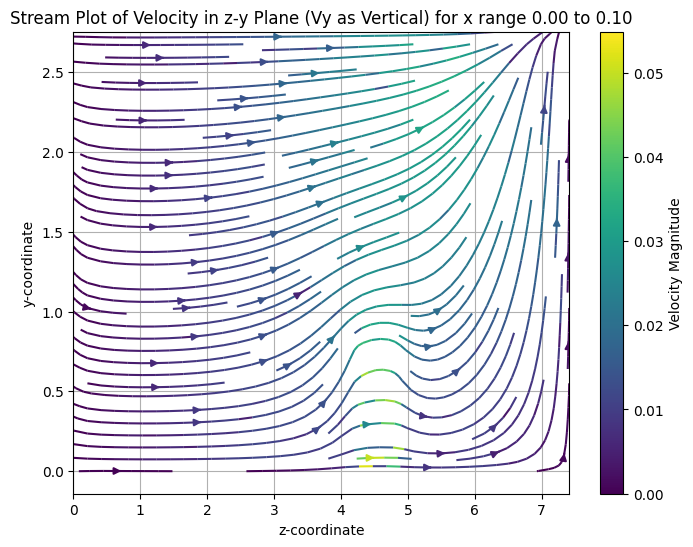

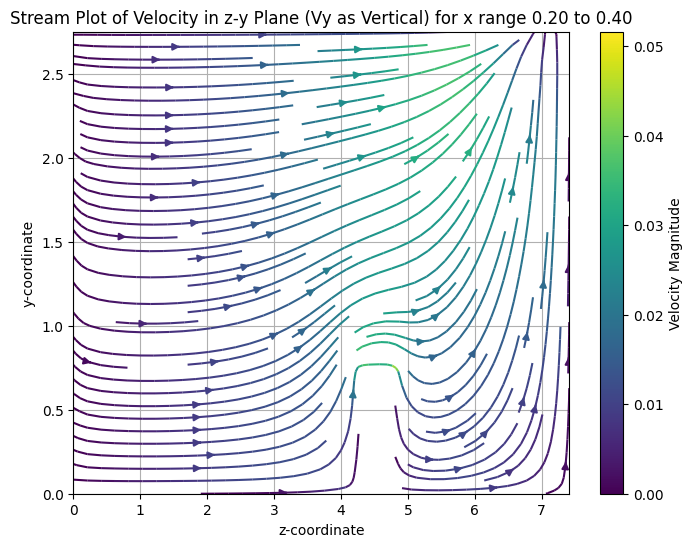

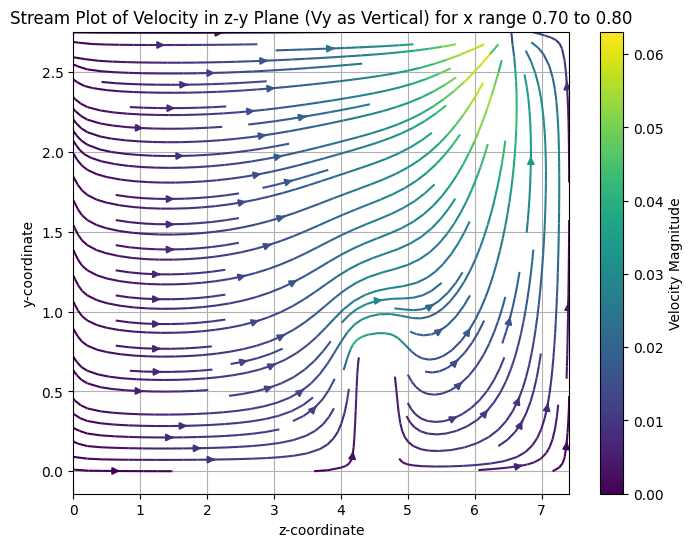

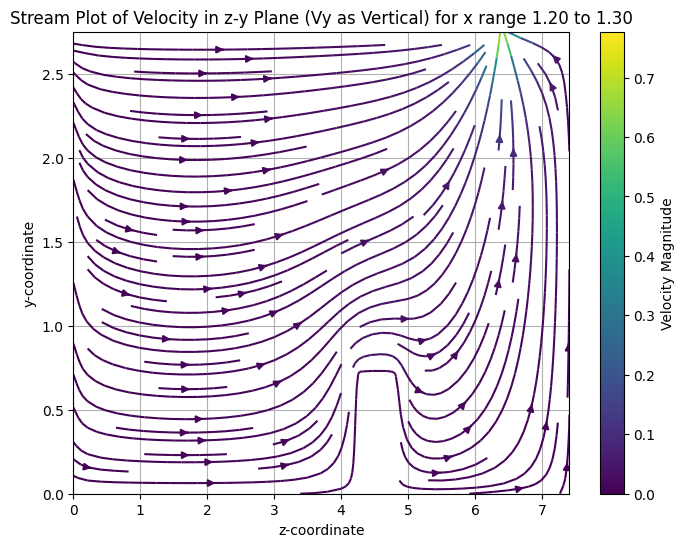

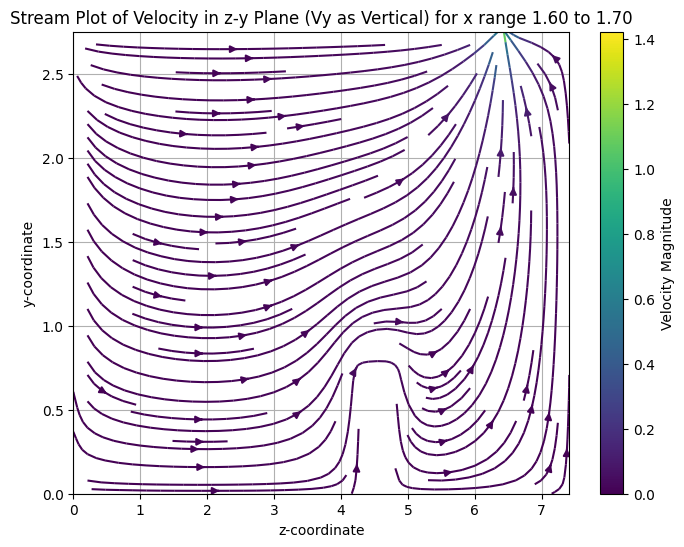

...

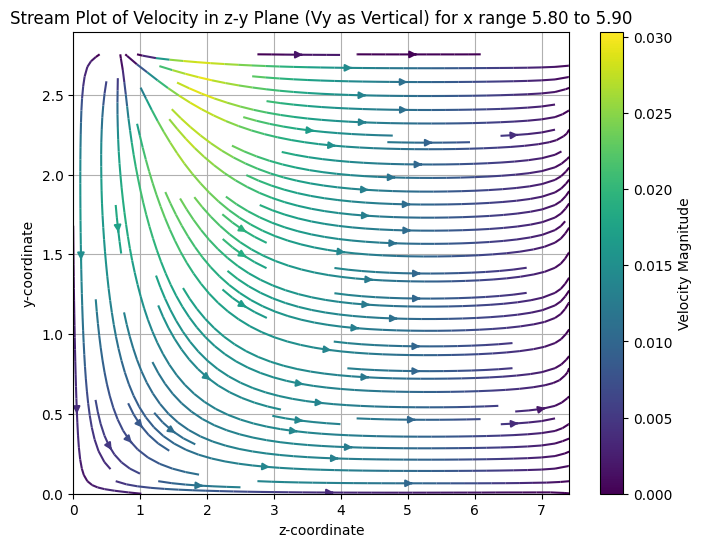

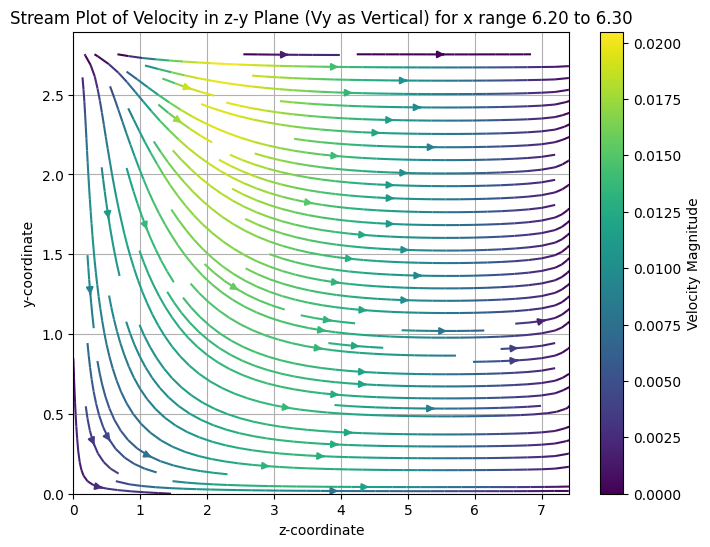

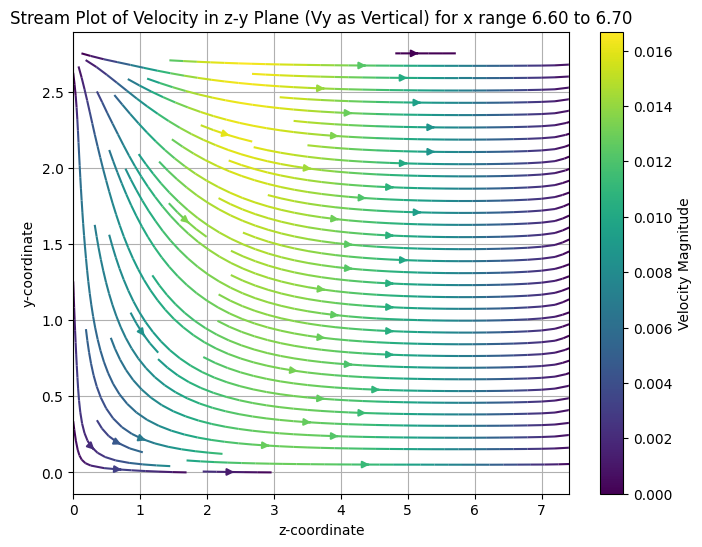

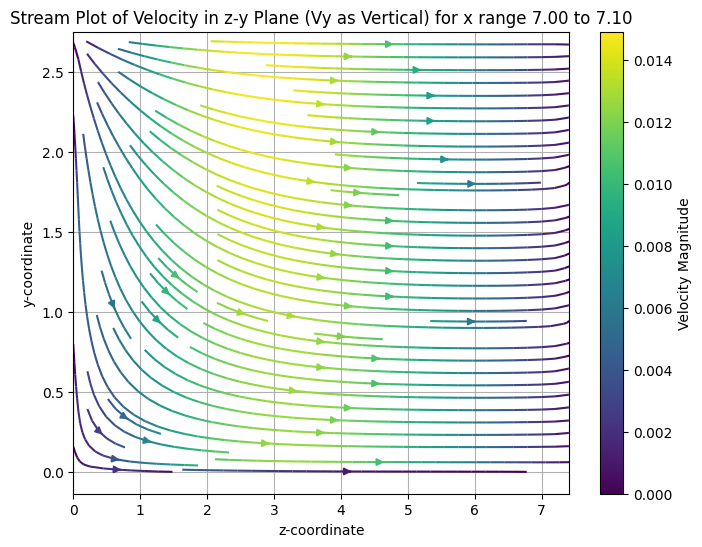

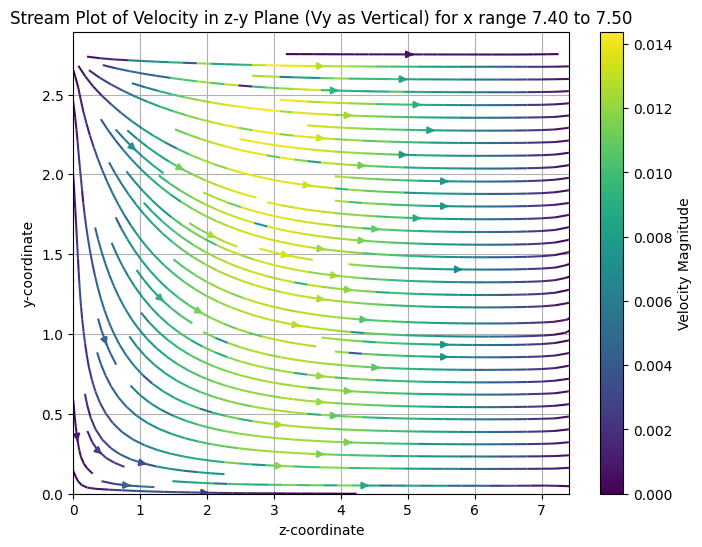

In [83]:
from scipy.interpolate import LinearNDInterpolator
import matplotlib.pyplot as plt
import numpy as np

# Define x-ranges
x_ranges = [
    (0, 0.1),
    (0.2, 0.4),
    (0.7, 0.8),
    (1.2, 1.3),
    (1.6, 1.7),
    (2.1, 2.2),
    (2.5, 2.6),
    (2.9, 3.1),
    (3.4, 3.5),
    (3.8, 3.9),
    (4.2, 4.3),
    (4.6, 4.7),
    (5.0, 5.1),
    (5.4, 5.5),
    (5.8, 5.9),
    (6.2, 6.3),
    (6.6, 6.7),
    (7.0, 7.1),
    (7.4, 7.5)
]

# Loop through the x ranges and generate a plot for each
for i, (x_min, x_max) in enumerate(x_ranges):
    # Filter the DataFrame for the current x range
    df_filtered = df[(df['x'] >= x_min) & (df['x'] <= x_max)]

    if df_filtered.empty:
        print(f"No data for x range {x_min} to {x_max}")
        continue

    # Extract y, z, vy, vz values for the current x range
    y, z, vy, vz = df_filtered['y'], df_filtered['z'], df_filtered['vy'], df_filtered['vz']

    # Create a grid of points for interpolation
    Z, Y = np.meshgrid(
        np.linspace(z.min(), z.max(), 100),
        np.linspace(y.min(), y.max(), 100),
    )

    # Use LinearNDInterpolator for faster interpolation
    interpolator_vy = LinearNDInterpolator(list(zip(y, z)), vy)
    interpolator_vz = LinearNDInterpolator(list(zip(y, z)), vz)

    # Evaluate the interpolators on the grid
    Vy = interpolator_vy(Y, Z)
    Vz = interpolator_vz(Y, Z)

    # Mask NaN values in Vy and Vz
    Vy = np.ma.masked_invalid(Vy)
    Vz = np.ma.masked_invalid(Vz)

    # Create the stream plot with Vy as the vertical velocity component
    plt.figure(figsize=(8, 6))
    plt.streamplot(Z, Y, Vz, Vy, color=np.sqrt(Vy**2 + Vz**2), cmap='viridis', density=1.2)
    plt.colorbar(label='Velocity Magnitude')
    plt.title(f'Stream Plot of Velocity in z-y Plane (Vy as Vertical) for x range {x_min:.2f} to {x_max:.2f}')
    plt.xlabel('z-coordinate')
    plt.ylabel('y-coordinate')
    plt.grid()
    plt.show()


# View from left side of room


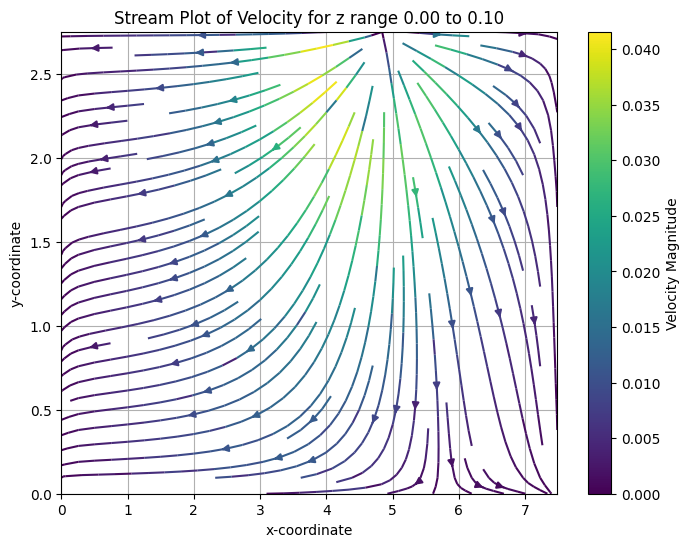

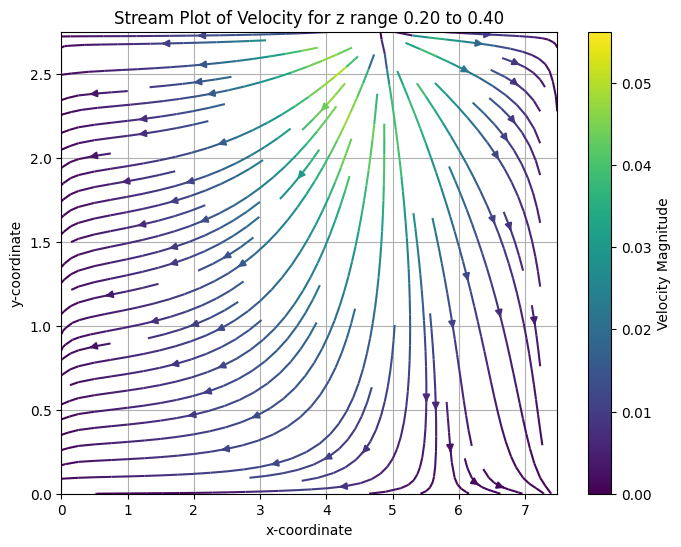

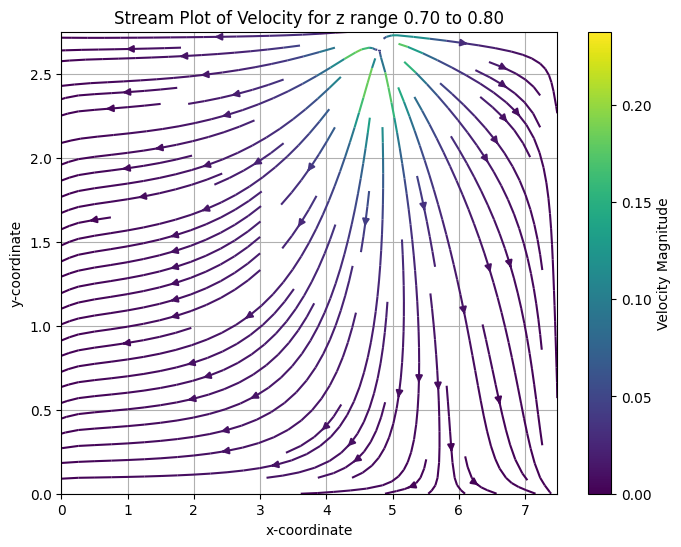

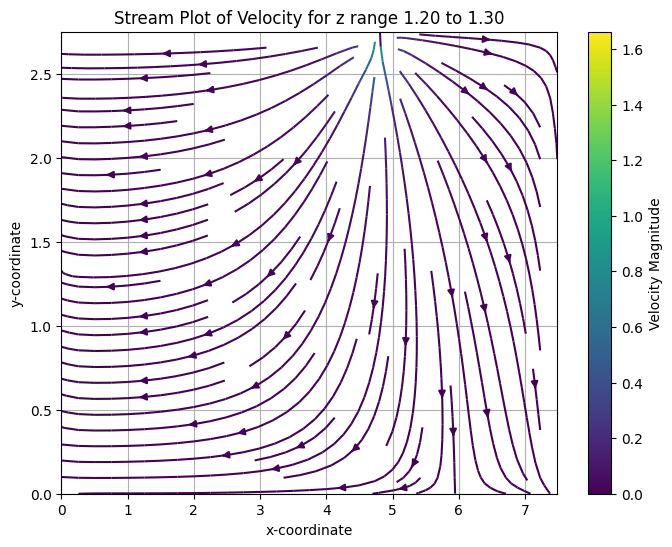

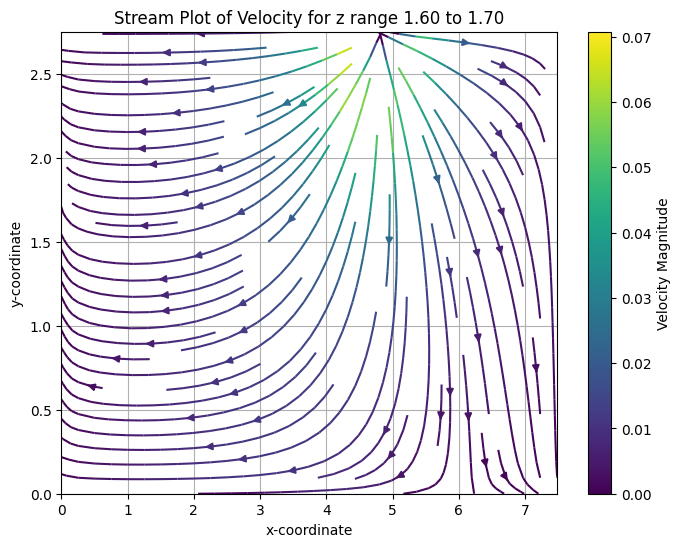

...

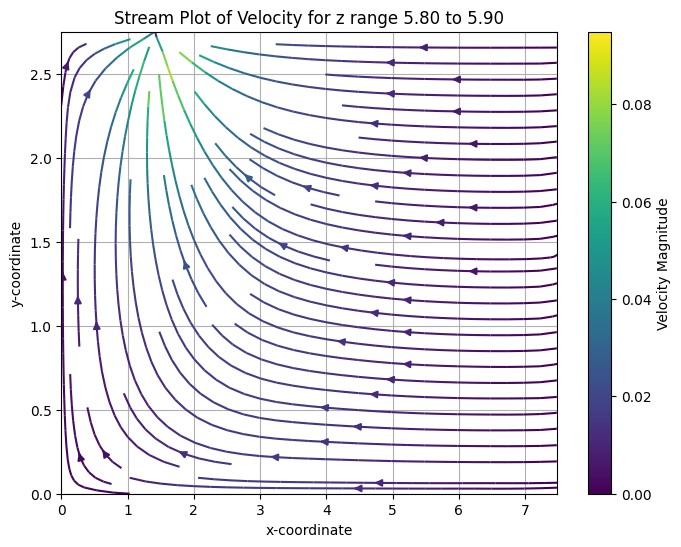

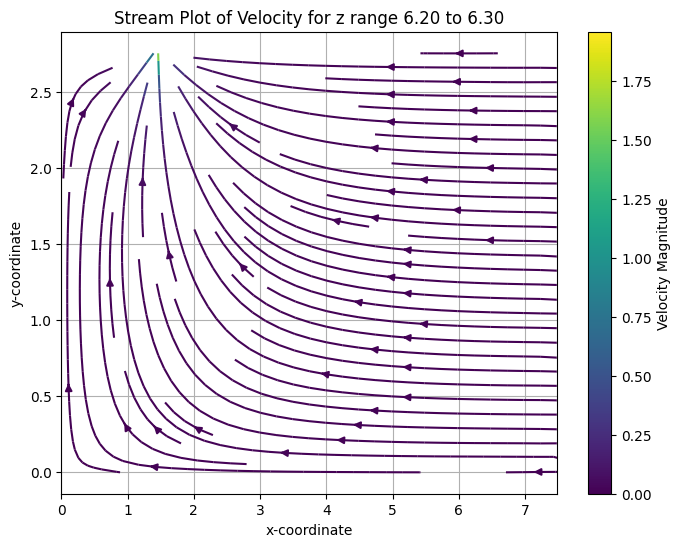

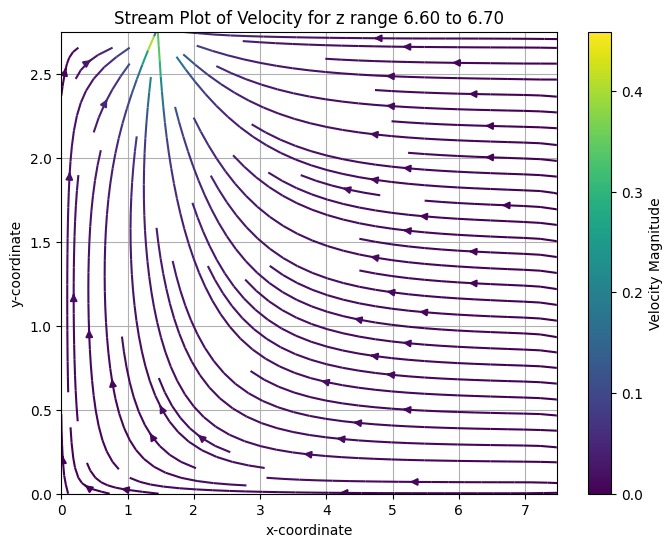

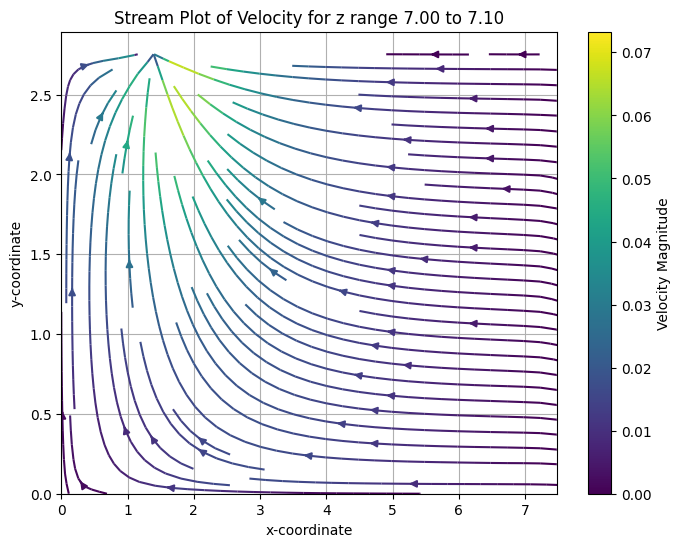

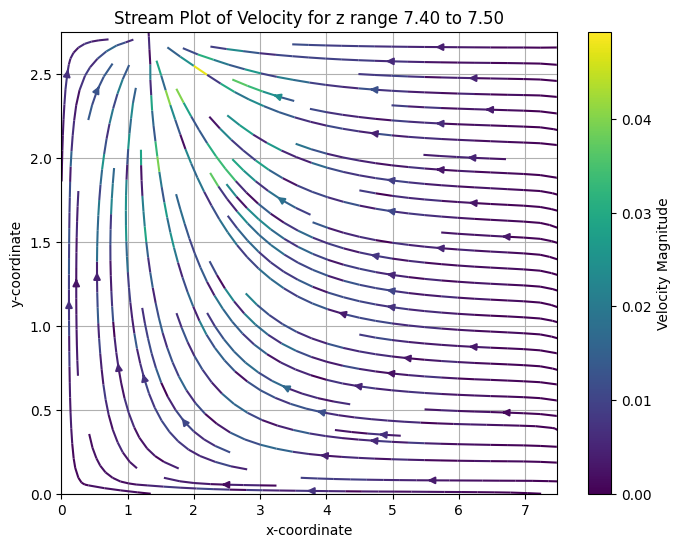

In [34]:
from scipy.interpolate import LinearNDInterpolator
import matplotlib.pyplot as plt
import numpy as np
z_ranges = [
    (0, 0.1),
    (0.2, 0.4),
    (0.7, 0.8),
    (1.2, 1.3),
    (1.6, 1.7),
    (2.1, 2.2),
    (2.5, 2.6),
    (2.9, 3.1),
    (3.4, 3.5),
    (3.8, 3.9),
    (4.2, 4.3),
    (4.6, 4.7),
    (5.0, 5.1),
    (5.4, 5.5),
    (5.8, 5.9),
    (6.2, 6.3),
    (6.6, 6.7),
    (7.0, 7.1),
    (7.4, 7.5)
]


# Loop through the z ranges and generate a plot for each
for i, (z_min, z_max) in enumerate(z_ranges):
    # Filter the DataFrame for the current z range
    df_filtered = df[(df['z'] >= z_min) & (df['z'] <= z_max)]

    if df_filtered.empty:
        print(f"No data for z range {z_min} to {z_max}")
        continue

    # Extract x, y, vx, vy values for the current z range
    x, y, vx, vy = df_filtered['x'], df_filtered['y'], df_filtered['vx'], df_filtered['vy']

    # Create a grid of points for interpolation
    X, Y = np.meshgrid(
        np.linspace(x.min(), x.max(), 100),
        np.linspace(y.min(), y.max(), 100),
    )

    # Use LinearNDInterpolator for faster interpolation
    interpolator_vx = LinearNDInterpolator(list(zip(x, y)), vx)
    interpolator_vy = LinearNDInterpolator(list(zip(x, y)), vy)

    # Evaluate the interpolators on the grid
    Vx = interpolator_vx(X, Y)
    Vy = interpolator_vy(X, Y)

    # Create the stream plot
    plt.figure(figsize=(8, 6))
    plt.streamplot(X, Y, Vx, Vy, color=np.sqrt(Vx**2 + Vy**2), cmap='viridis')
    plt.colorbar(label='Velocity Magnitude')
    plt.title(f'Stream Plot of Velocity for z range {z_min:.2f} to {z_max:.2f}')
    plt.xlabel('x-coordinate')
    plt.ylabel('y-coordinate')
    plt.grid()
    plt.show()